### Evghenii Gaisinschii 336551072
### Eugene Golovanov 323554121

In [1]:
from sklearn.datasets import fetch_20newsgroups
import pandas as pd
import nltk
from nltk.corpus import stopwords
import time
from datetime import datetime 
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import ComplementNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import GaussianNB

first_time = datetime.now() 

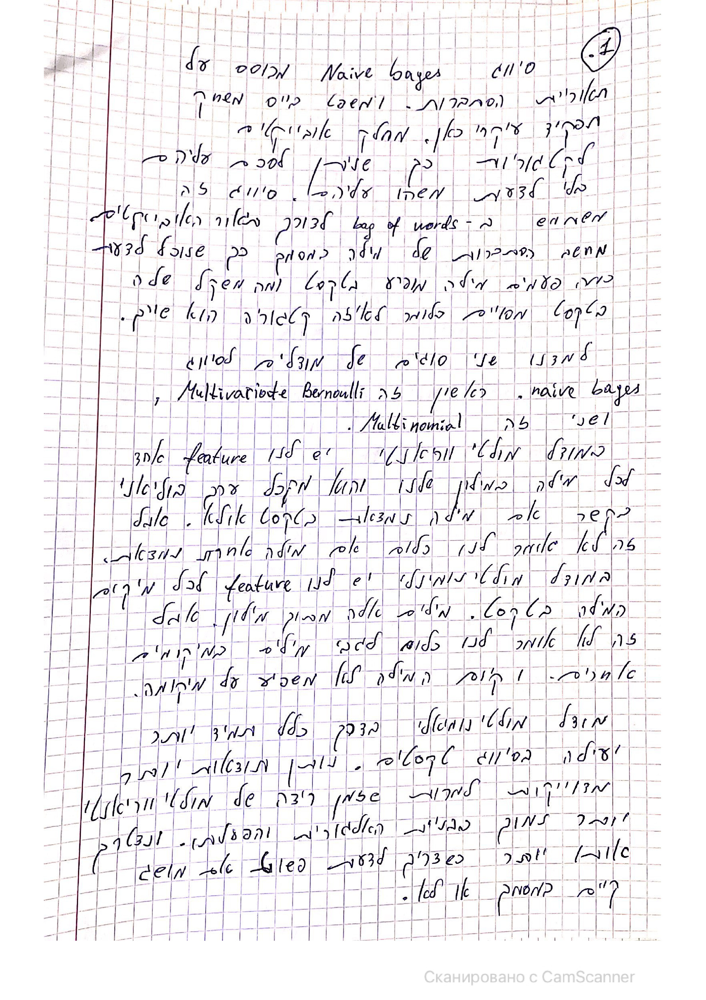

In [2]:
from IPython.display import Image
Image("Desktop\\theory-1.jpg")

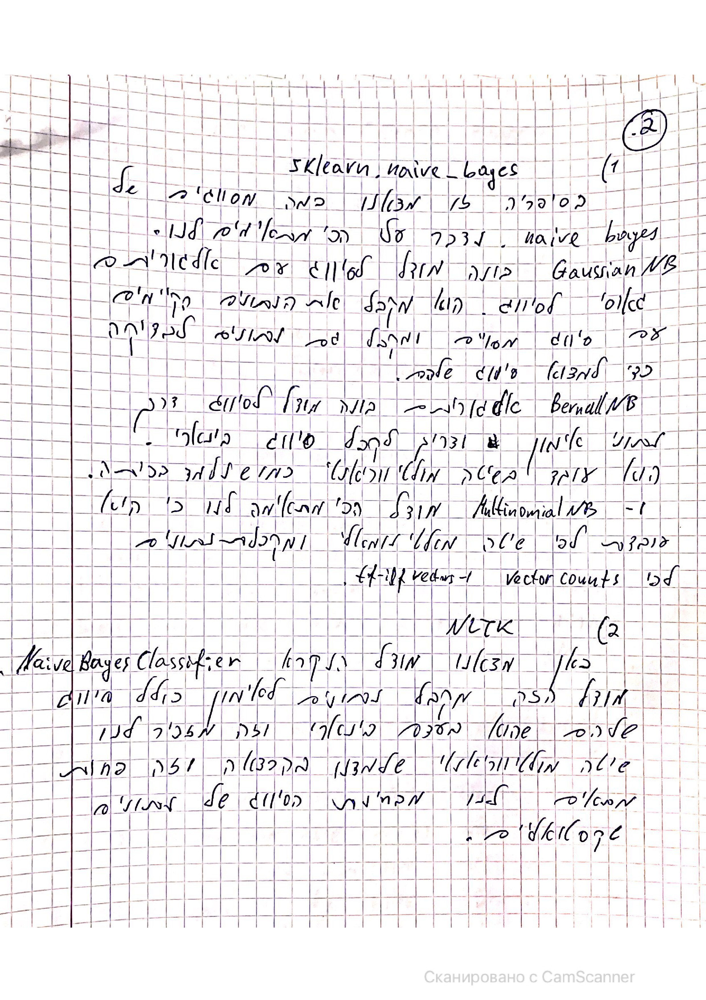

In [3]:
from IPython.display import Image
Image("Desktop\\theory-2.jpg")

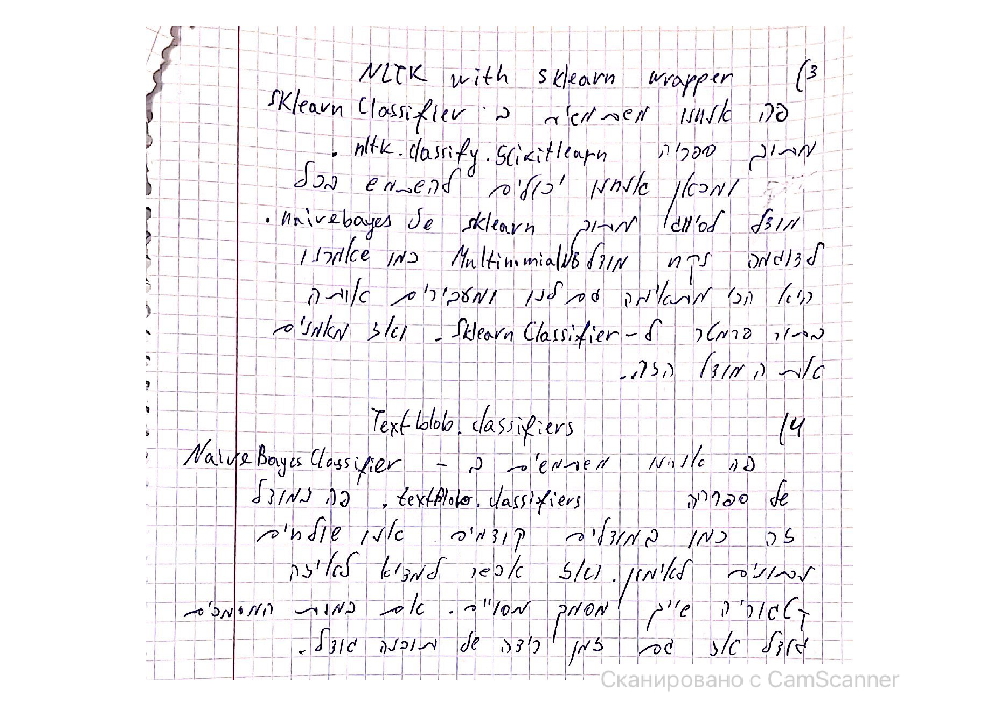

In [4]:
from IPython.display import Image
Image("Desktop\\theory-3.jpg")

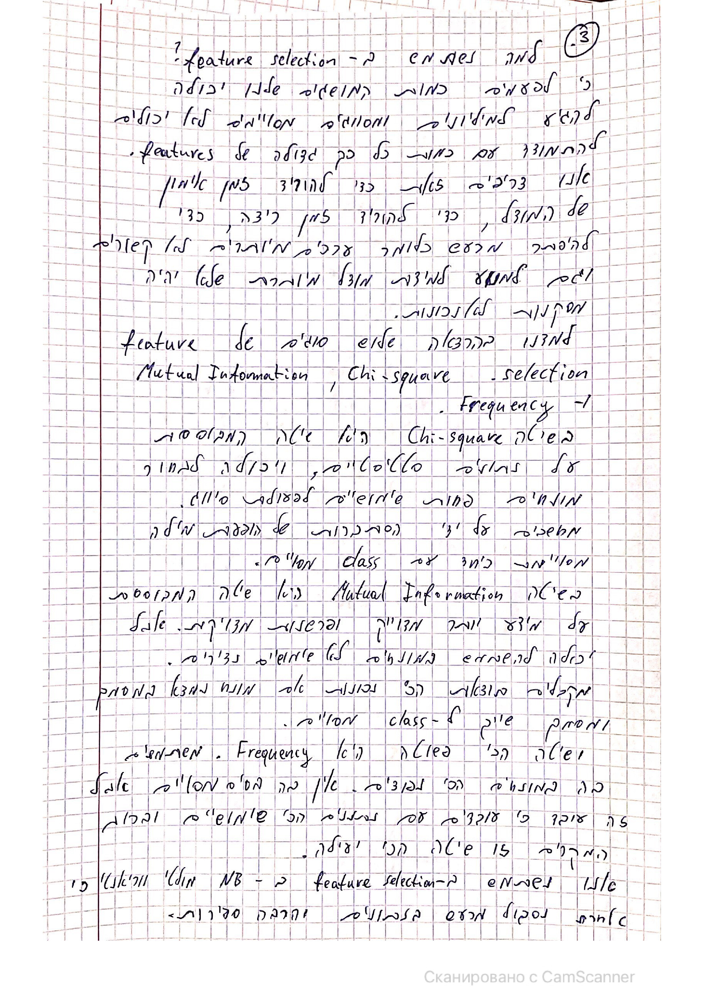

In [5]:
from IPython.display import Image
Image("Desktop\\theory-4.jpg")

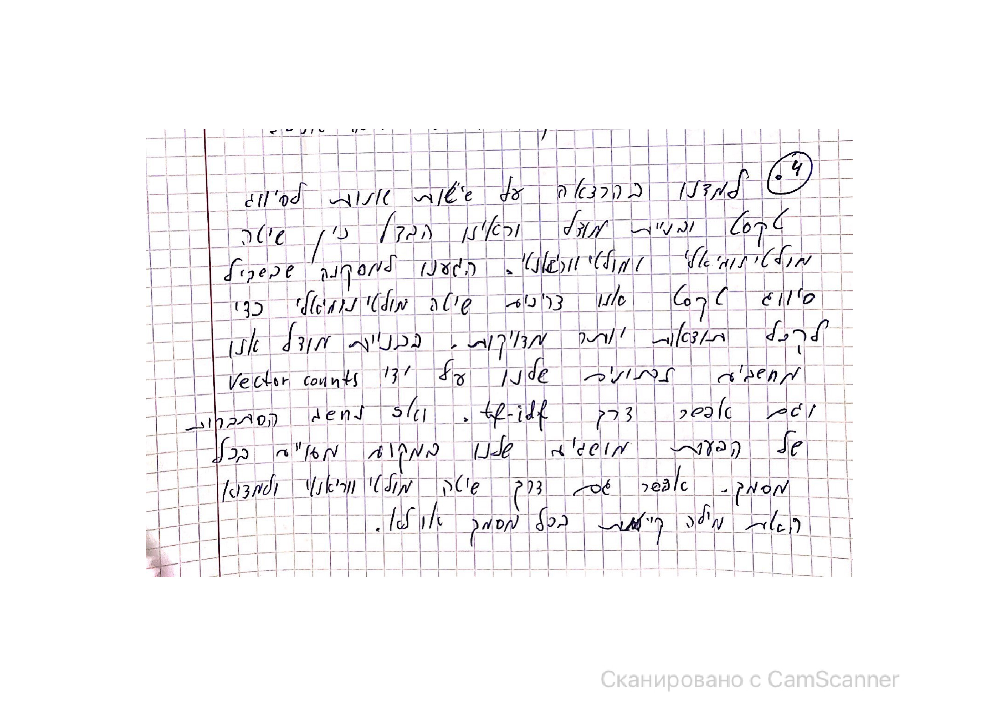

In [6]:
from IPython.display import Image
Image("Desktop\\theory-5.jpg")

### 8

In [7]:
categories = ['talk.politics.misc', 'talk.religion.misc', 'comp.graphics', 'sci.space']

newsgroups_train = fetch_20newsgroups(subset='all', categories=categories, remove=('headers', 'footers', 'quotes'))
#newsgroups_test = fetch_20newsgroups(subset='train', categories=categories, remove=('headers', 'footers', 'quotes'))

df = pd.DataFrame(data={'text': list(newsgroups_train.data) ,'label': list(newsgroups_train.target) })

In [8]:
#data cleaning

stop_words = set(stopwords.words('english'))
df['text'] = df['text'].str.lower()
df['text'] = df['text'].str.replace('[^\w\s]','') 
df['text'] = df['text'].str.replace('[^a-z ]','') 
df['text'] = df['text'].apply(lambda x: " ".join(x for x in x.split() if x not in stop_words))

In [ ]:
def multNom(df_train,df_test,data_name='text',target_name='label'):
    df_train=df_train.fillna("")
    df_test=df_test.fillna("")
    start_time = datetime.now()
    label_dict={}
    
    
    
    tf = TfidfVectorizer(analyzer='word',ngram_range=(1,1), min_df=0)
    tfidf_matrix = tf.fit_transform(df_train[data_name])
    wordDict=tf.vocabulary_
    
    
    new_df=pd.DataFrame( [[float(0)]*len(wordDict.keys())]*len(set(df_train[target_name].values)), index=set(df_train[target_name].values) )
    new_df.columns = wordDict.keys()
    
    P_Cj_dict={}
    
    for category in set(df_train[target_name].values):
        
        category_df=df_train[df_train[target_name] == category]
        
        tf_1 = TfidfVectorizer(analyzer='word',ngram_range=(1,1), min_df=0)
        #tfidf_matrix = tf_1.fit_transform(category_df[data_name])
        #wordDict=tf-1.vocabulary_
        
        

        ################# CREATE ########################
        
        P_Cj_dict[category]= len(df_train[target_name].values)/len(df_train[data_name])
        
        for text in category_df[data_name]:
            word_set=set(text.split())
            #tfidf_matrix = tf_1.fit_transform(text)
            #word_set=set((tf_1.vocabulary_).keys())

#             row_df=df_test[df_train[target_name] == text]
        
#             new_tf = TfidfVectorizer(analyzer='word',ngram_range=(1,1), min_df=0)
#             new_tfidf_matrix = new_tf.fit_transform(row_df[data_name])
#             wordDict=tf.vocabulary_
#             wordSet=set(wordDict.keys())

            for word in word_set:
                if word in wordDict.keys(): 
                    new_df[word][category]+=1
                
        for word in new_df:
            new_df[word][category] += 1
            new_df[word][category] /= (len(category_df[data_name])+len(wordDict.keys()))
    create_time=datetime.now() - start_time
        ################# CREATE ########################
        
    count=0
    result_dict={}
    for text in df_test[data_name]:
        
        row_df=df_test[df_train[target_name] == text]
        
#         tf = TfidfVectorizer(analyzer='word',ngram_range=(1,1), min_df=0)
#         tfidf_matrix = tf.fit_transform(row_df[data_name])
#         wordDict=tf.vocabulary_
#         wordSet=set(wordDict.keys())
        word_set=set(text.split())
        
        
        temp_result_dict={}
        
        
        for category in set(df_test[target_name].values):
            temp_result_dict[category]=1
            for word in word_set:
                if word in wordDict.keys():
                    temp_result_dict[category] *= new_df[word][category]
            temp_result_dict[category] *= P_Cj_dict[category]
        
        temp_max=max(temp_result_dict.values())
        
        for category in temp_result_dict.keys():
            if temp_result_dict[category]==temp_max:
                result_dict[count]=category
        
    return result_dict,create_time



#####################################################################################################################################
#####################################################################################################################################
#####################################################################################################################################
def multVirt(df_train,df_test,data_name='text',target_name='label'):
    df_train=df_train.fillna("")
    df_test=df_test.fillna("")
    start_time = datetime.now()
    label_dict={}
    
    
    
    tf = TfidfVectorizer(analyzer='word',ngram_range=(1,1), min_df=0)
    tfidf_matrix = tf.fit_transform(df_train[data_name])
    wordDict=tf.vocabulary_
    
    
    new_df=pd.DataFrame( [[float(0)]*len(wordDict.keys())]*len(set(df_train[target_name].values)), index=set(df_train[target_name].values) )
    new_df.columns = wordDict.keys()
    
    P_Cj_dict={}
    
    for category in set(df_train[target_name].values):
        
        category_df=df_train[df_train[target_name] == category]
        
        tf_1 = TfidfVectorizer(analyzer='word',ngram_range=(1,1), min_df=0)
#         tfidf_matrix = tf.fit_transform(category_df[data_name])
#         wordDict=tf.vocabulary_
        
        

        ################# CREATE ########################
        
        P_Cj_dict[category]= len(df_train[target_name].values)/len(df_train[data_name])
        
        for text in category_df[data_name]:
            word_set=set(text.split())
#             tfidf_matrix = tf_1.fit_transform(text)
#             word_set=set((tf_1.vocabulary_).keys())

#             row_df=df_test[df_train[target_name] == text]
        
#             new_tf = TfidfVectorizer(analyzer='word',ngram_range=(1,1), min_df=0)
#             new_tfidf_matrix = new_tf.fit_transform(row_df[data_name])
#             wordDict=tf.vocabulary_
#             wordSet=set(wordDict.keys())

            for word in word_set:
                if word in wordDict.keys(): 
                    new_df[word][category]+=1
                
        for word in new_df:
            new_df[word][category] += 1
            new_df[word][category] /= (len(category_df[data_name])+2)
    create_time=datetime.now() - start_time
        ################# CREATE ########################
        
    count=0
    result_dict={}
    for text in df_test[data_name]:
        
        row_df=df_test[df_train[target_name] == text]
        
#         newtf = TfidfVectorizer(analyzer='word',ngram_range=(1,1), min_df=0)
#         tfidf_matrix = newtf.fit_transform(row_df[data_name])
#         wordDict=newtf.vocabulary_
#         wordSet=set(wordDict.keys())
        word_set=set(text.split())
        
        
        temp_result_dict={}
        
        
        for category in set(df_test[target_name].values):
            temp_result_dict[category]=1
            for word in word_set:
                if word in wordDict.keys():
                    temp_result_dict[category] *= new_df[word][category]
            temp_result_dict[category] *= P_Cj_dict[category]
        
        temp_max=max(temp_result_dict.values())
        
        for category in temp_result_dict.keys():
            if temp_result_dict[category]==temp_max:
                result_dict[count]=category
        
    return result_dict,create_time



In [ ]:
r1,t1=multVirt(df_train,df_test,data_name='text',target_name='label')
r2,t2=multNom(df_train,df_test,data_name='text',target_name='label')

In [9]:
X = df['text']
y = df['label']

first_cos_time = datetime.now() 
#TfidfVectorizer

X_train, X_test, y_train, y_test = train_test_split(X, y)
vectorizer = TfidfVectorizer(stop_words='english')
X_train_dtm = vectorizer.fit_transform(X_train)
X_test_dtm = vectorizer.transform(X_test)

first_cos_time_final = datetime.now() - first_cos_time
print('Time elapsed in (hh:mm:ss.ms): "{}"'.format(first_cos_time_final))

Time elapsed in (hh:mm:ss.ms): "0:00:01.350253"


In [10]:
# from sklearn.linear_model import LogisticRegression
# clf_lr = LogisticRegression()
# clf_lr.fit(X_train_dtm, y_train)
# y_pred = clf_lr.predict(X_test_dtm)
# lr_score = accuracy_score(y_test, y_pred) # perfectly balanced binary classes
# print(lr_score)

In [11]:
###8
###i


# ComplementNB standard multinomial naive Bayes (MNB) algorithm 
time1 = datetime.now() 

clf = ComplementNB()
clf.fit(X_train_dtm, y_train)
y_pred = clf.predict(X_test_dtm)
comp_score = accuracy_score(y_test, y_pred)
print(comp_score)
time1 = datetime.now() - time1
print('Time elapsed in (hh:mm:ss.ms): "{}"'.format(time1))



time2 = datetime.now() 
# MultinomialNB naive Bayes algorithm for multinomially distributed data

clf_mnb = MultinomialNB()
clf_mnb.fit(X_train_dtm, y_train)
y_pred = clf_mnb.predict(X_test_dtm)
mnb_score = accuracy_score(y_test, y_pred)
print(mnb_score)
time2 = datetime.now() - time2
print('Time elapsed in (hh:mm:ss.ms): "{}"'.format(time2))

0.8549346016646849
Time elapsed in (hh:mm:ss.ms): "0:00:00.035980"
0.7871581450653984
Time elapsed in (hh:mm:ss.ms): "0:00:00.019989"


In [12]:
###8
###ii

time3 = datetime.now() 
# BernoulliNB multivariate Bernoulli distributions


clf = BernoulliNB()
clf.fit(X_train_dtm, y_train)
y_pred = clf.predict(X_test_dtm)
bern_score = accuracy_score(y_test, y_pred)
print(bern_score)
time3 = datetime.now() - time3
print('Time elapsed in (hh:mm:ss.ms): "{}"'.format(time3))



time4 = datetime.now() 
# Gaussian Naive Bayes algorithm for classification

gausnb = GaussianNB()
gausnb.fit(X_train_dtm.toarray(), y_train)
y_pred = gausnb.predict(X_test_dtm.toarray())
gausnb_score = accuracy_score(y_test, y_pred)
print(gausnb_score)
time4 = datetime.now() - time4
print('Time elapsed in (hh:mm:ss.ms): "{}"'.format(time4))

0.6206896551724138
Time elapsed in (hh:mm:ss.ms): "0:00:00.047486"
0.7883472057074911
Time elapsed in (hh:mm:ss.ms): "0:00:08.000721"


### Execution time

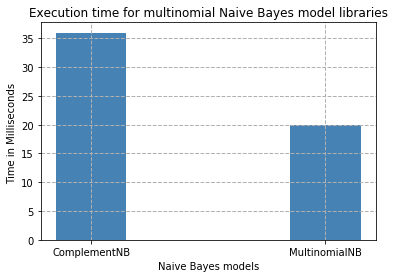

In [13]:
l = [time1.microseconds/1000,time2.microseconds/1000]
x = np.arange(len(l))
plt.bar(x+1,l,width = 0.3, color = 'steelblue')
plt.grid( linestyle='--', linewidth=1)
plt.xlabel('Naive Bayes models')
plt.ylabel('Time in Milliseconds ')
plt.xticks([1,2],['ComplementNB','MultinomialNB'])
plt.title('Execution time for multinomial Naive Bayes model libraries')
plt.yticks()
plt.style.use('default')
plt.show()

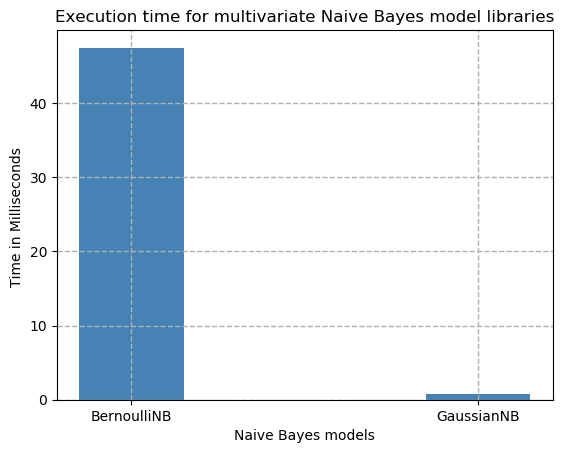

In [14]:
l = [time3.microseconds/1000,time4.microseconds/1000]
x = np.arange(len(l))
plt.bar(x+1,l,width = 0.3, color = 'steelblue')
plt.grid( linestyle='--', linewidth=1)
plt.xlabel('Naive Bayes models')
plt.ylabel('Time in Milliseconds ')
plt.xticks([1,2],['BernoulliNB','GaussianNB'])
plt.title('Execution time for multivariate Naive Bayes model libraries')
plt.yticks()
plt.style.use('default')
plt.show()

### Accuracy score

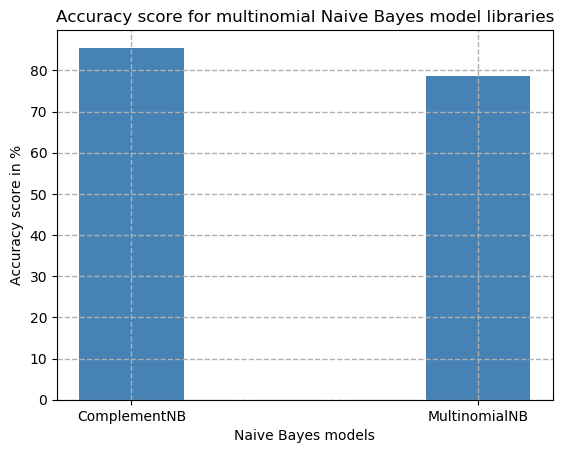

In [15]:
l = [comp_score*100,mnb_score*100]
x = np.arange(len(l))
plt.bar(x+1,l,width = 0.3, color = 'steelblue')
plt.grid( linestyle='--', linewidth=1)
plt.xlabel('Naive Bayes models')
plt.ylabel('Accuracy score in %')
plt.xticks([1,2],['ComplementNB','MultinomialNB'])
plt.title('Accuracy score for multinomial Naive Bayes model libraries')
plt.yticks()
plt.style.use('default')
plt.show()

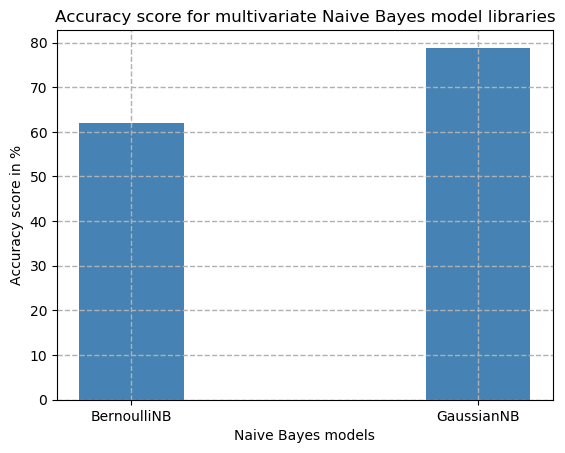

In [16]:
l = [bern_score*100,gausnb_score*100]
x = np.arange(len(l))
plt.bar(x+1,l,width = 0.3, color = 'steelblue')
plt.grid( linestyle='--', linewidth=1)
plt.xlabel('Naive Bayes models')
plt.ylabel('Accuracy score in %')
plt.xticks([1,2],['BernoulliNB','GaussianNB'])
plt.title('Accuracy score for multivariate Naive Bayes model libraries')
plt.yticks()
plt.style.use('default')
plt.show()

In [17]:
first_time_final = datetime.now() - first_time
print('Time elapsed in (hh:mm:ss.ms): "{}"'.format(first_time_final))

Time elapsed in (hh:mm:ss.ms): "0:00:17.561522"


### As we can see on our graphs, multinomial models take very less time time  then multivariative.
### Also accuracy score of multinomial models give much more accurate result.
### It is obvious that multinomial models are more effective and powerful for text classification.
### Especialy MultinomialNB model that gives the most effective results.

### 3
### Summary

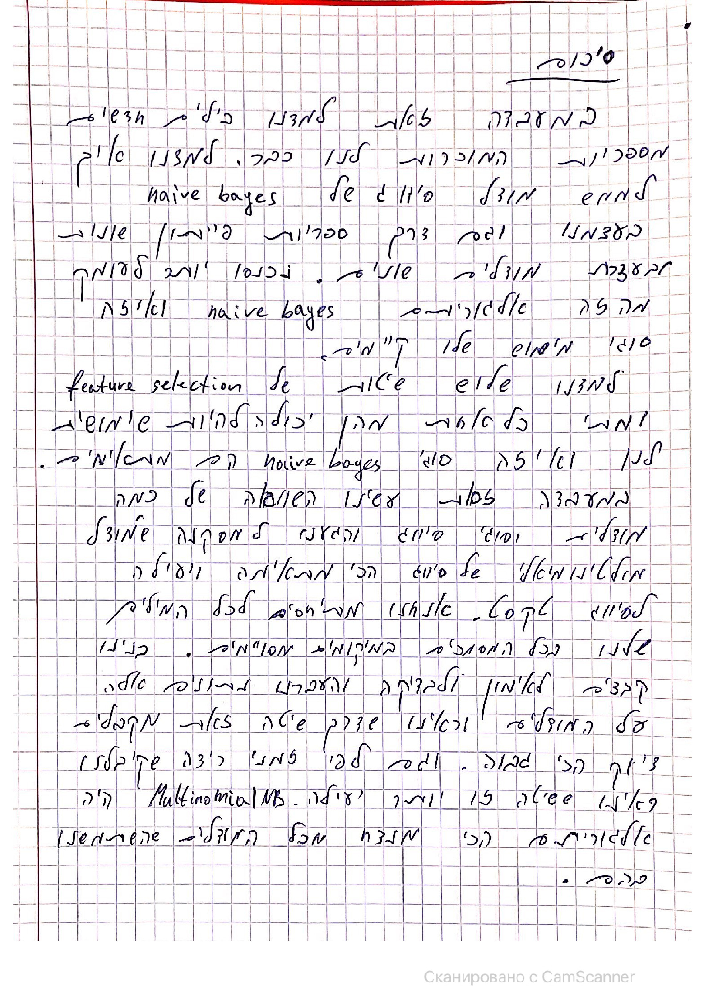

In [18]:

from IPython.display import Image
Image("Desktop\\theory-6.jpg")